In [1]:
!date

Thu Dec  1 14:37:33 PST 2022


# Comparisons between separately clustered CTRL and EXP datasets
#### Unfiltered data obtained from using kb with multimapping function. Ref genome includes WRE.

___

In [2]:
%config InlineBackend.figure_format = 'retina'
%load_ext blackcellmagic

In [3]:
import sys
import anndata
import scvi

import scanpy as sc
import numpy as np
from scipy import stats

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# Custom violinplot code
from plotting_funcs import violinplot

import pandas as pd

sc.set_figure_params(figsize=(6, 6), frameon=False)
sc.settings.n_jobs=2

In [4]:
# set random seed
np.random.seed(926)

In [5]:
def nd(arr):
    """
    Funciton to transform numpy matrix to nd array.
    """
    return np.asarray(arr).reshape(-1)

___

# Load clustered and celltype assigned ctrl/experiment data

In [6]:
adata_exp = anndata.read('../../finchseq_data/exp_celltype.h5ad')

# Mark celltype and connectivity with "e" for experiment
adata_exp.obs["batch_g"] = "experiment"
adata_exp.obs["celltype_sep"] = adata_exp.obs["celltype"].astype(str) + "_e"
adata_exp.obs["connectivity_sep"] = adata_exp.obs["connectivity"].astype(str) + "_e"
adata_exp.obs.head()

,species,batch,n_counts_processed,batch_index,n_counts_raw,leiden,celltype,connectivity,batch_g,celltype_sep,connectivity_sep
barcode,,,,,,,,,,,
AAACCCACAAAGACGC-0,zebrafinch,experiment1,886.000000,0,886.000000,0,glutamatergic neurons 1,undefined 1,experiment,glutamatergic neurons 1_e,undefined 1_e
AAACCCACAGGACTAG-0,zebrafinch,experiment1,3870.000000,0,3870.000000,2,migrating neuroblasts 1,1,experiment,migrating neuroblasts 1_e,1_e
AAACCCACATATTCGG-0,zebrafinch,experiment1,2177.000000,0,2177.000000,8,astrocytes 1,2,experiment,astrocytes 1_e,2_e
AAACCCAGTATGTCAC-0,zebrafinch,experiment1,7167.000000,0,7167.000000,12,undefined 1,3,experiment,undefined 1_e,3_e
AAACCCATCATACAGC-0,zebrafinch,experiment1,4868.000488,0,4868.000488,7,microglia 2,4,experiment,microglia 2_e,4_e


In [7]:
adata_ctrl = anndata.read('../../finchseq_data/ctrl_celltype.h5ad')

# Mark celltype and connectivity with "c" for control
adata_ctrl.obs["batch_g"] = "control"
adata_ctrl.obs["celltype_sep"] = adata_ctrl.obs["celltype"].astype(str) + "_c"
adata_ctrl.obs["connectivity_sep"] = adata_ctrl.obs["connectivity"].astype(str) + "_c"
adata_ctrl.obs

,species,batch,n_counts_processed,batch_index,n_counts_raw,leiden,celltype,connectivity,batch_g,celltype_sep,connectivity_sep
barcode,,,,,,,,,,,
AAACCCAAGCACTGGA-0,zebrafinch,control1,483.000000,0,483.000000,15,mural cells 1,0,control,mural cells 1_c,0_c
AAACCCAAGCGTCAAG-0,zebrafinch,control1,946.000061,0,946.000061,12,microglia 1,1,control,microglia 1_c,1_c
AAACCCAAGGTCACAG-0,zebrafinch,control1,1068.000000,0,1068.000000,1,GABAergic neurons 1,2,control,GABAergic neurons 1_c,2_c
AAACCCAAGTCATTGC-0,zebrafinch,control1,1407.000000,0,1407.000000,9,astrocytes 2,3,control,astrocytes 2_c,3_c
AAACCCAAGTGCTACT-0,zebrafinch,control1,1060.000000,0,1060.000000,11,GABAergic neurons 2,4,control,GABAergic neurons 2_c,4_c
...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGCAAATAAGC-1,zebrafinch,control2,663.000000,1,663.000000,0,glutamatergic neurons 1,undefined 1,control,glutamatergic neurons 1_c,undefined 1_c
TTTGTTGCAGTTGTCA-1,zebrafinch,control2,1120.000000,1,1120.000000,9,astrocytes 2,3,control,astrocytes 2_c,3_c
TTTGTTGCATCGATAC-1,zebrafinch,control2,1177.000000,1,1177.000000,9,astrocytes 2,3,control,astrocytes 2_c,3_c


In [8]:
adata = adata_ctrl.concatenate(adata_exp, 
                             join='outer', 
                             batch_key='batch_index', 
                             batch_categories=None, 
                             uns_merge=None,
                             fill_value=np.nan)

In [9]:
adata.obs.head()

,species,batch,n_counts_processed,batch_index,n_counts_raw,leiden,celltype,connectivity,batch_g,celltype_sep,connectivity_sep
barcode,,,,,,,,,,,
AAACCCAAGCACTGGA-0-0,zebrafinch,control1,483.000000,0,483.000000,15,mural cells 1,0,control,mural cells 1_c,0_c
AAACCCAAGCGTCAAG-0-0,zebrafinch,control1,946.000061,0,946.000061,12,microglia 1,1,control,microglia 1_c,1_c
AAACCCAAGGTCACAG-0-0,zebrafinch,control1,1068.000000,0,1068.000000,1,GABAergic neurons 1,2,control,GABAergic neurons 1_c,2_c
AAACCCAAGTCATTGC-0-0,zebrafinch,control1,1407.000000,0,1407.000000,9,astrocytes 2,3,control,astrocytes 2_c,3_c
AAACCCAAGTGCTACT-0-0,zebrafinch,control1,1060.000000,0,1060.000000,11,GABAergic neurons 2,4,control,GABAergic neurons 2_c,4_c


___

# Which celltypes are distant from each other in UMAP?

In [10]:
# Define number of nearest neighbours based on the variance ratio plot above
n_neighbors = 20
n_pcs = 10

# Find nearest neighbours
sc.pp.neighbors(adata, n_neighbors=n_neighbors, n_pcs=n_pcs, random_state=0)

In [11]:
sc.tl.umap(adata)

... storing 'batch' as categorical
... storing 'leiden' as categorical
... storing 'celltype' as categorical
... storing 'connectivity' as categorical
... storing 'batch_g' as categorical
... storing 'celltype_sep' as categorical
... storing 'connectivity_sep' as categorical


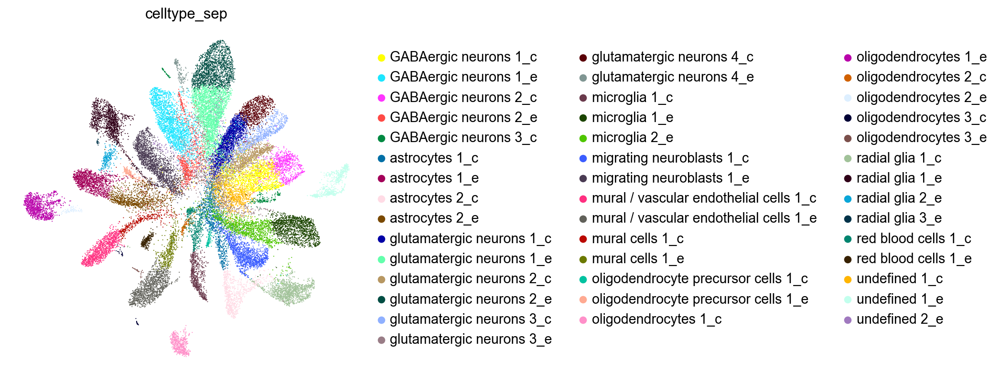

In [12]:
sc.pl.umap(adata, 
#            palette="tab20",
           color="celltype_sep")

___

# Were barcodes from mixed vs separately clustered datasets assigned to the same celltypes?

___

# Plot expression of HVC-X/-RA markers in glut neurons

In [13]:
# all_markers = [
#     "SLC17A6_ENSTGUG00000004570.2",
#     "UTS2B_ENSTGUG00000009278.2",
#     "HPCAL1_ENSTGUG00000013044.2",
#     "ALDH1A2_ENSTGUG00000006178.2",
#     "DCN_ENSTGUG00000008178.2",
#     "FNDC9_ENSTGUG00000000654.2",
#     "NTS_ENSTGUG00000027877.1",
# #    
#     "_ENSTGUG00000008926.2", 
#     'PENK_ENSTGUG00000011112.2',
#     'CXCL14_ENSTGUG00000017226.2', 
#     '_ENSTGUG00000001973.2',
#     'NPTX2_ENSTGUG00000008623.2',
# #    
#     'CCK_ENSTGUG00000004682.2',
#     'NTS_ENSTGUG00000027877.1',
#     'CHL1_ENSTGUG00000009997.2',
#     'PTN_ENSTGUG00000025134.1',
#     'VIP_ENSTGUG00000020465.1',
# #    
#     "GFRA1_ENSTGUG00000018882.1",
#     "SCUBE1_ENSTGUG00000012016.2",    
#     "CACNA1G_ENSTGUG00000009049.2",
#     "GRIA2_ENSTGUG00000005484.2",
#     "GRIA4_ENSTGUG00000012676.2",
# #
#     "BDNF_ENSTGUG00000004743.2",
#     "FOSL2_ENSTGUG00000024611.1",
#     "HOMER1_ENSTGUG00000003711.2",
#     "ARC_ENSTGUG00000012727.2",
#     "TNFAIP8L3_ENSTGUG00000028388.1",
#     "EGR1_ENSTGUG00000000003.2",
# #    
#     'TBR1_ENSTGUG00000006709.2', 
#     'FABP7_ENSTGUG00000011826.2',
#     'NOTCH2_ENSTGUG00000017231.2',
#     "NELL1_ENSTGUG00000004458.2",

# #
#     "NPTXR_ENSTGUG00000024678.1",
#     "NPTX1_ENSTGUG00000025297.1", 
#     "NPTX2_ENSTGUG00000008623.2",  
#     "NRXN1_ENSTGUG00000005731.2",
#     "CNTN4_ENSTGUG00000010102.2",
#     "CACNA2D1_ENSTGUG00000002536.2", 
# #
# #     "_ENSTGUG00000017273.2",
# #     "_ENSTGUG00000028417.1",
# #     "_ENSTGUG00000004607.2",
# ]

# # Define marker groups
# var_groups = [
#     (0, 0),
#     (1, 2),
#     (3, 6),
#     (7, 11),
#     (12, 16),
#     (17, 17),
#     (18, 18),
#     (19, 19),
#     (20, 20),
#     (21, 21),
#     (22, 27),
#     (28, 31),
#     (32, 37),
#     (38, 40)
# ]

# # Define marker group labels
# var_labels = [
#     "Glutamatergic neuron",
#     "HVC-RA",
#     "HVC-X",
#     "HVC-RA DE genes in CTRL",
#     "HVC-X DE genes in CTRL",
#     "Colquitt HVC-RA",
#     "Colquitt HVC-X",
#     "Colquitt HVCAv",
#     "Torok undefined",
#     "Colquitt immature HVC-RA?",
#     "Neuronal activity",
#     "Neurogenesis",
#     "Synaptogenesis \n (DE from CTRL undefined)"
# #     "MHC1-associated",
# ]

In [14]:
all_markers = [
    "SLC17A6_ENSTGUG00000004570.2",
    "UTS2B_ENSTGUG00000009278.2",
    "HPCAL1_ENSTGUG00000013044.2",
    "ALDH1A2_ENSTGUG00000006178.2",
    "DCN_ENSTGUG00000008178.2",
    "FNDC9_ENSTGUG00000000654.2",
    "NTS_ENSTGUG00000027877.1",
#    
    "_ENSTGUG00000008926.2", 
    'PENK_ENSTGUG00000011112.2',
    'CXCL14_ENSTGUG00000017226.2', 
    '_ENSTGUG00000001973.2',
    'NPTX2_ENSTGUG00000008623.2',
#    
    'CCK_ENSTGUG00000004682.2',
    'CHL1_ENSTGUG00000009997.2',
    'PTN_ENSTGUG00000025134.1',
    'VIP_ENSTGUG00000020465.1',
#
    '_ENSTGUG00000023451.1',
    '_ENSTGUG00000026378.1',
    'GRIA2_ENSTGUG00000005484.2',
    'GRIA4_ENSTGUG00000012676.2',
    'GPM6B_ENSTGUG00000008166.2', 
    'NPTXR_ENSTGUG00000024678.1',
    'CACNA2D1_ENSTGUG00000002536.2',
#    
    "GFRA1_ENSTGUG00000018882.1",
    "SCUBE1_ENSTGUG00000012016.2",    
    "CACNA1G_ENSTGUG00000009049.2",
#
    "BDNF_ENSTGUG00000004743.2",
    "FOSL2_ENSTGUG00000024611.1",
    "HOMER1_ENSTGUG00000003711.2",
    "ARC_ENSTGUG00000012727.2",
    "TNFAIP8L3_ENSTGUG00000028388.1",
    "EGR1_ENSTGUG00000000003.2",
#    
    'TBR1_ENSTGUG00000006709.2', 
    'FABP7_ENSTGUG00000011826.2',
    'NOTCH2_ENSTGUG00000017231.2',
    "NELL1_ENSTGUG00000004458.2",
##
#     "_ENSTGUG00000017273.2",
#     "_ENSTGUG00000028417.1",
#     "_ENSTGUG00000004607.2",
##
#     "NPTXR_ENSTGUG00000024678.1",
#     "NPTX1_ENSTGUG00000025297.1", 
#     "NPTX2_ENSTGUG00000008623.2",  
#     "NRXN1_ENSTGUG00000005731.2",
#     "CNTN4_ENSTGUG00000010102.2",
#     "CACNA2D1_ENSTGUG00000002536.2",
]

# Define marker groups
var_groups = [
    (0, 0),
    (1, 2),
    (3, 6),
    (7, 11),
    (12, 15),
    (16, 22),
    (23, 23),
    (24, 24),
    (25, 25),
    (26, 31),
    (32, 35),
#     (36, 38),
#     (39, 44)
]

# Define marker group labels
var_labels = [
    "Glutamatergic neuron marker",
    "HVC-RA markers",
    "HVC-X markers",
    "CTRL HVC-RA DE genes",
    "CTRL HVC-X DE genes",
    "CTRL undefined 1 DE genes",
    "Colquitt HVC-RA",
    "Colquitt HVC-X",
    "Colquitt HVC-Av",
    "Neuronal activity markers",
    "Neurogenesis markers",
#     "MHC-associated",
#     "Synaptogenesis (DE from CTRL undefined)"
]

Trying to set attribute `.uns` of view, copying.


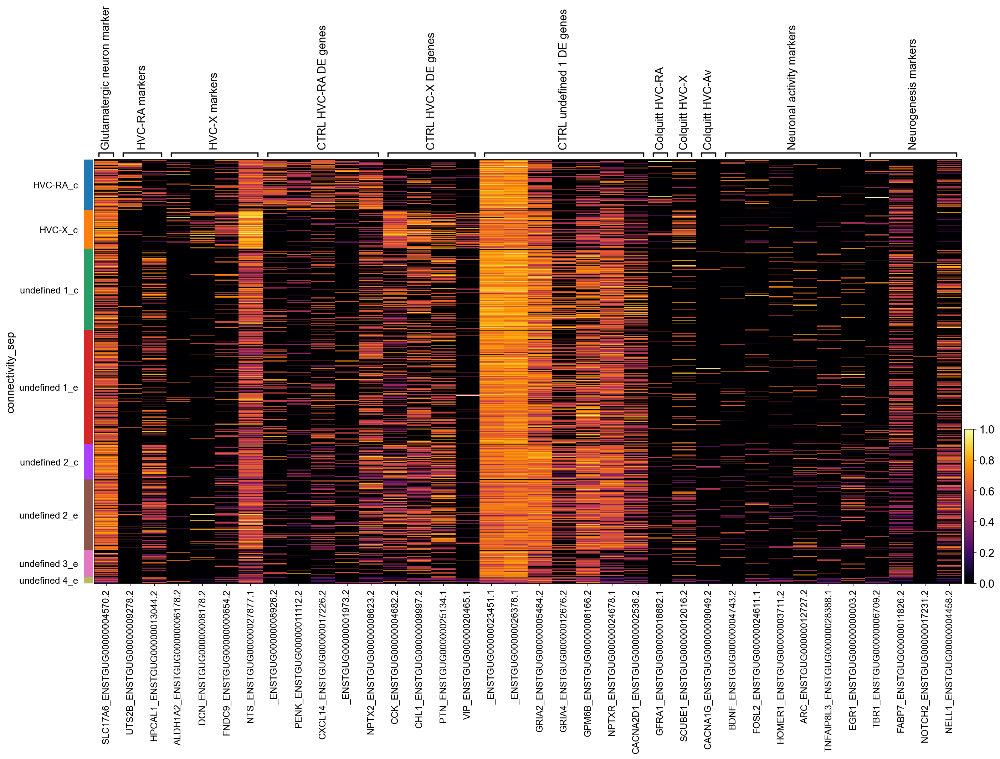

In [15]:
sc.pl.heatmap(
    adata[np.char.startswith(nd(adata.obs.celltype.values).astype(str), "glutamatergic neurons")],
    all_markers,
    groupby="connectivity_sep",
#     dendrogram=True, # This messes up the ordering of the celltypes
    show_gene_labels=True,
    var_group_positions=var_groups,
    var_group_labels=var_labels,
    var_group_rotation=90,
    use_raw=False, # By default adata.raw.X is plotted. If use_raw=False is set, then adata.X is plotted. 
    cmap="inferno", # Alternative cmap: magma
    standard_scale="var", # standardize that dimension between 0 and 1, meaning for each variable or observation, subtract the minimum and divide each by its maximum
    swap_axes=False,
    figsize=(20, 10)
)

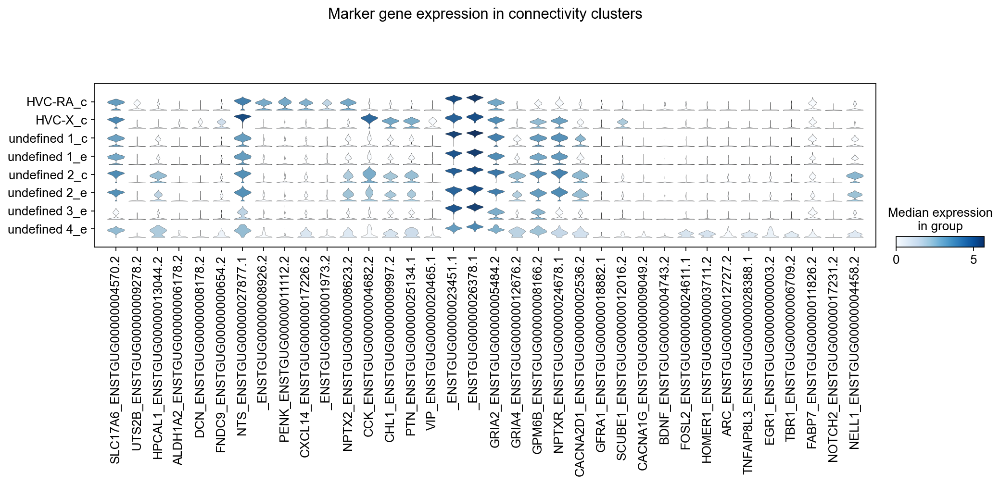

In [16]:
sc.pl.stacked_violin(adata[np.char.startswith(nd(adata.obs.celltype.values).astype(str), "glutamatergic neurons")], 
                     all_markers, 
                     groupby='connectivity_sep', 
                     title="Marker gene expression in connectivity clusters", 
                     rotation=90, 
                     sharey=True,
                     use_raw=False,
                     swap_axes=False,
#                      vmin=0,
#                      vmax=0.75
                    )

# Hypothesis: undefined 1 approximates HVC-RA while undefined 2 approximates HVC-X.

# To know for in situs: In which other cell types are these markers expressed?

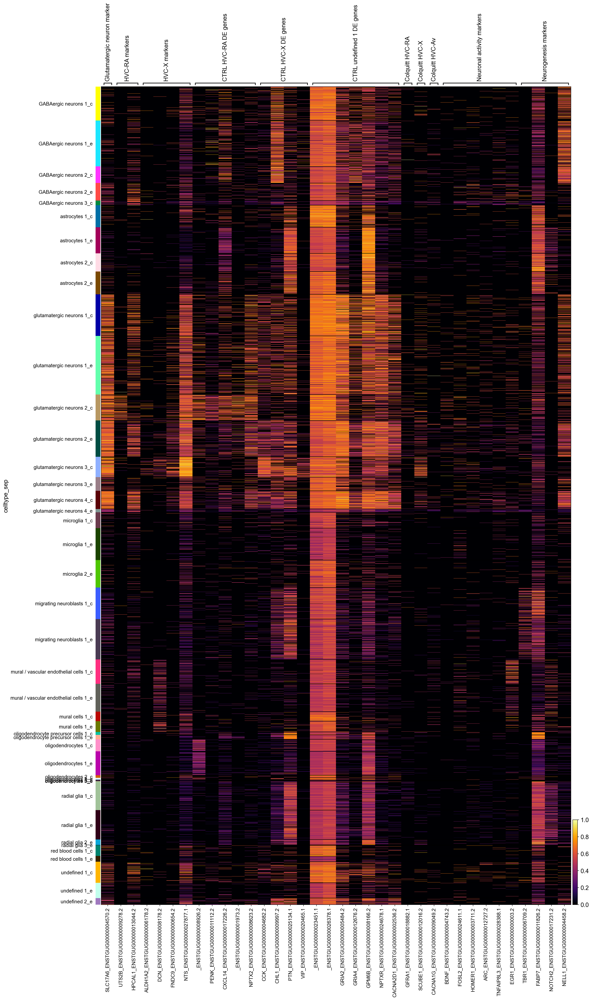

In [17]:
sc.pl.heatmap(
    adata,
    all_markers,
    groupby="celltype_sep",
#     dendrogram=True, # This messes up the ordering of the celltypes
    show_gene_labels=True,
    var_group_positions=var_groups,
    var_group_labels=var_labels,
    var_group_rotation=90,
    use_raw=False, # By default adata.raw.X is plotted. If use_raw=False is set, then adata.X is plotted. 
    cmap="inferno", # Alternative cmap: magma
    standard_scale="var", # standardize that dimension between 0 and 1, meaning for each variable or observation, subtract the minimum and divide each by its maximum
    swap_axes=False,
    figsize=(20, 35)
)

# Synpatic strength markers in glut neurons
Markers from: https://www.nature.com/articles/s41598-020-77260-2

In [18]:
syn_strength = [
    "SYT1_ENSTGUG00000007572.2",
    "HOMER1_ENSTGUG00000003711.2",
    "CALR_ENSTGUG00000014982.2",
    "LMAN1_ENSTGUG00000014591.2",
    "SYNPO_ENSTGUG00000000864.2"
]

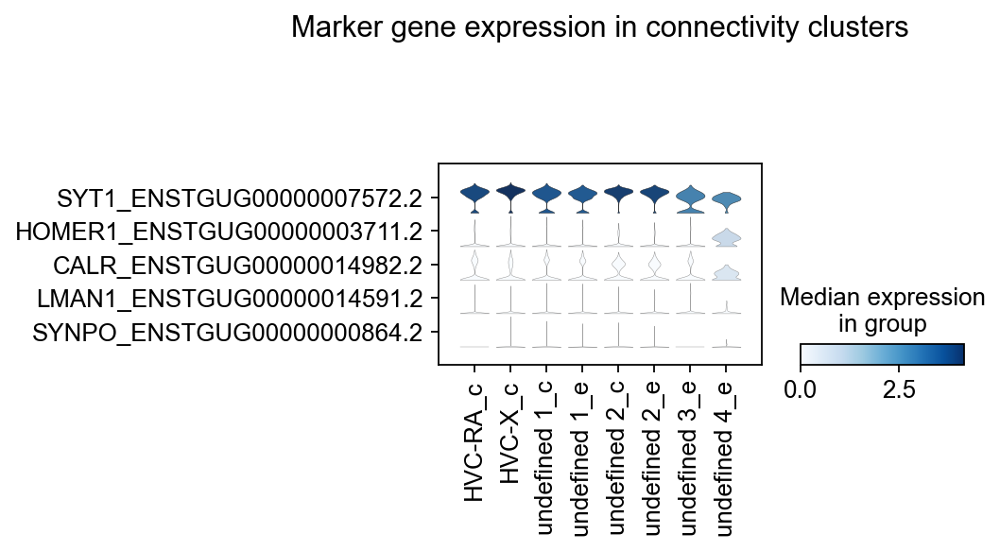

In [19]:
sc.pl.stacked_violin(adata[np.char.startswith(nd(adata.obs.celltype.values).astype(str), "glutamatergic neurons")], 
                     syn_strength, 
                     groupby='connectivity_sep', 
                     title="Marker gene expression in connectivity clusters", 
                     rotation=90, 
                     sharey=True,
                     use_raw=False,
                     swap_axes=True,
#                      vmin=0,
#                      vmax=0.75
                    )

# HVC markers in glut neurons and all cells
Are the undefined clusters glutamatergic neurons form outside HVC that were accidentally included during the dissection?
https://bmcgenomics.biomedcentral.com/articles/10.1186/s12864-018-4578-0#Sec13

In [20]:
hvc_markers = [
# Down in HVC
#     "GRM1_ENSTGUG00000010757.2",
#     "UTS2_ENSTGUG00000002545.2",
#     "PLXNC1_ENSTGUG00000008290.2",
#     "CDH4_ENSTGUG00000007909.2",
#     "CDH8_ENSTGUG00000009281.2",
#     "RELN_ENSTGUG00000002836.2",
#     "SLIT1_ENSTGUG00000009734.2",
#     "ROBO1_ENSTGUG00000013537.2",
#     "UNC5C_ENSTGUG00000003206.2",
#     "UNC5D_ENSTGUG00000004556.2",
#     "CDH4_ENSTGUG00000007909.2",
    "SCN3B_ENSTGUG00000000607.2",
# Up in HVC
#     "CADPS2_ENSTGUG00000004403.2",
#     "ACKR3_ENSTGUG00000003645.2",
#     "SEMA3E_ENSTGUG00000002487.2",
#     "SEMA5A_ENSTGUG00000007664.2",
#     "SEMA6D_ENSTGUG00000007065.2",
#     "GABRE_ENSTGUG00000006374.2",
#     "CBLN2_ENSTGUG00000009205.2",
#     "PLXND1_ENSTGUG00000010534.2",
#     "PLXNA4_ENSTGUG00000001967.2",
#     "NRP1_ENSTGUG00000000947.2",
#     "CDH6_ENSTGUG00000001940.2",
#     "CDH9_ENSTGUG00000001934.2",
#     "ROBO2_ENSTGUG00000013538.2",
#     "FLRT2_ENSTGUG00000012394.2",
    
]

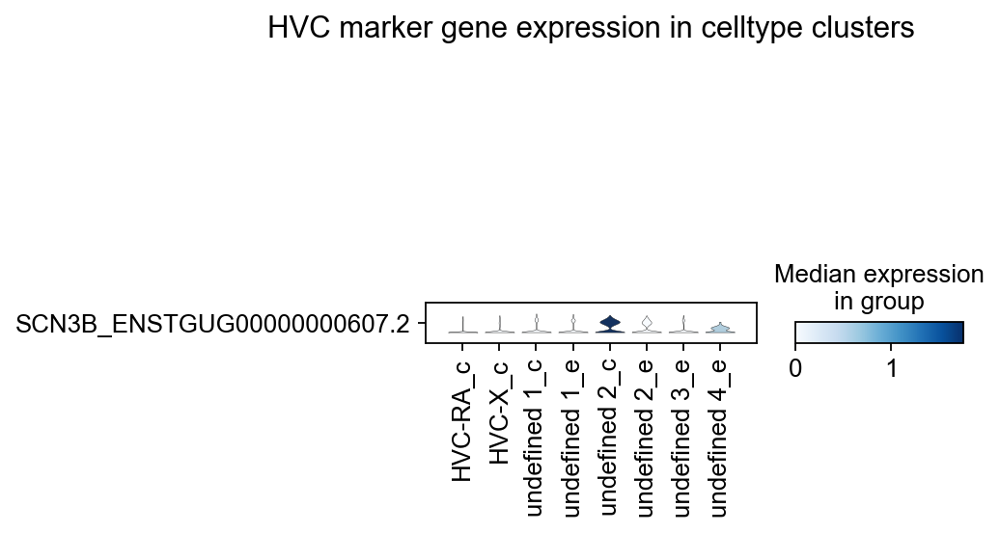

In [21]:
sc.pl.stacked_violin(adata[np.char.startswith(nd(adata.obs.celltype.values).astype(str), "glutamatergic neurons")], 
                     hvc_markers, 
                     groupby='connectivity_sep', 
                     title="HVC marker gene expression in celltype clusters", 
                     rotation=90, 
                     sharey=True,
                     use_raw=False,
                     swap_axes=True,
#                      vmin=0,
#                      vmax=0.75
                    )

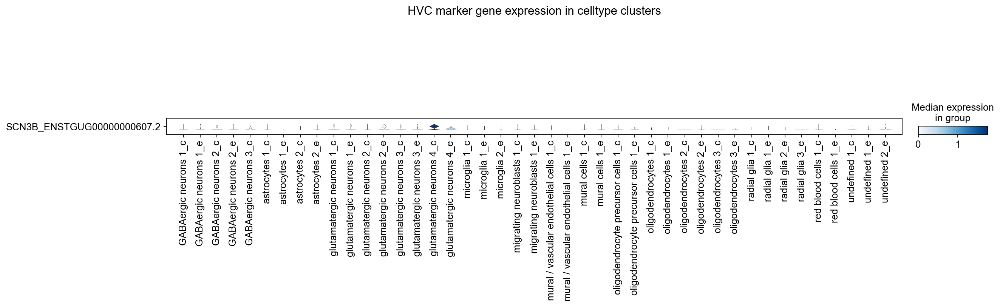

In [22]:
sc.pl.stacked_violin(adata, 
                     hvc_markers, 
                     groupby='celltype_sep', 
                     title="HVC marker gene expression in celltype clusters", 
                     rotation=90, 
                     sharey=True,
                     use_raw=False,
                     swap_axes=True,
#                      vmin=0,
#                      vmax=0.75
                    )

___

# Does each main celltype contain an equal number of cells from each batch/dataset?

Let's look at the actual number of cells from each batch for each celltype:

In [23]:
# Create columns containing general celltype assignment - ignoring cluster separation
adata.obs['celltype_g'] = adata.obs['celltype'].str.replace('\d+', '')
adata.obs.head()

/home/lauraluebbert/bin/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: FutureWarning: The default value of regex will change from True to False in a future version.
  


,species,batch,n_counts_processed,batch_index,n_counts_raw,leiden,celltype,connectivity,batch_g,celltype_sep,connectivity_sep,celltype_g
barcode,,,,,,,,,,,,
AAACCCAAGCACTGGA-0-0,zebrafinch,control1,483.000000,0,483.000000,15,mural cells 1,0,control,mural cells 1_c,0_c,mural cells
AAACCCAAGCGTCAAG-0-0,zebrafinch,control1,946.000061,0,946.000061,12,microglia 1,1,control,microglia 1_c,1_c,microglia
AAACCCAAGGTCACAG-0-0,zebrafinch,control1,1068.000000,0,1068.000000,1,GABAergic neurons 1,2,control,GABAergic neurons 1_c,2_c,GABAergic neurons
AAACCCAAGTCATTGC-0-0,zebrafinch,control1,1407.000000,0,1407.000000,9,astrocytes 2,3,control,astrocytes 2_c,3_c,astrocytes
AAACCCAAGTGCTACT-0-0,zebrafinch,control1,1060.000000,0,1060.000000,11,GABAergic neurons 2,4,control,GABAergic neurons 2_c,4_c,GABAergic neurons


In [24]:
# Normalize each celltype count to total number of cells in that batch by dividing
df_normalized = (adata.obs.groupby("celltype_g")["batch"].value_counts() / adata.obs.groupby("batch")["species"].count()).unstack().fillna(0)
df_normalized.columns = df_normalized.columns.astype(str)
df_normalized["total normalized count"] = df_normalized.sum(axis=1).values

df_normalized["control1_fraction"] = (df_normalized["control1"] / df_normalized["total normalized count"]).values
df_normalized["control2_fraction"] = (df_normalized["control2"] / df_normalized["total normalized count"]).values
df_normalized["experiment1_fraction"] = (df_normalized["experiment1"] / df_normalized["total normalized count"]).values
df_normalized["experiment2_fraction"] = (df_normalized["experiment2"] / df_normalized["total normalized count"]).values

df_normalized["total cellcount"] = adata.obs.groupby("celltype_g").size().values.astype(int)

df_normalized.head()

batch,control1,control2,experiment1,experiment2,total normalized count,control1_fraction,control2_fraction,experiment1_fraction,experiment2_fraction,total cellcount
celltype_g,,,,,,,,,,
GABAergic neurons,0.140531,0.172648,0.144173,0.135335,0.592687,0.237108,0.291296,0.243254,0.228342,5190
astrocytes,0.112363,0.109145,0.063457,0.134521,0.419487,0.267858,0.260187,0.151273,0.320681,3899
glutamatergic neurons,0.276042,0.320820,0.293278,0.215495,1.105635,0.249668,0.290168,0.265257,0.194906,9543
microglia,0.050599,0.033074,0.156112,0.113363,0.353148,0.143280,0.093655,0.442058,0.321006,3290
migrating neuroblasts,0.078357,0.101538,0.079678,0.093994,0.353567,0.221619,0.287181,0.225355,0.265845,3148


/home/lauraluebbert/bin/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:46: UserWarning: FixedFormatter should only be used together with FixedLocator


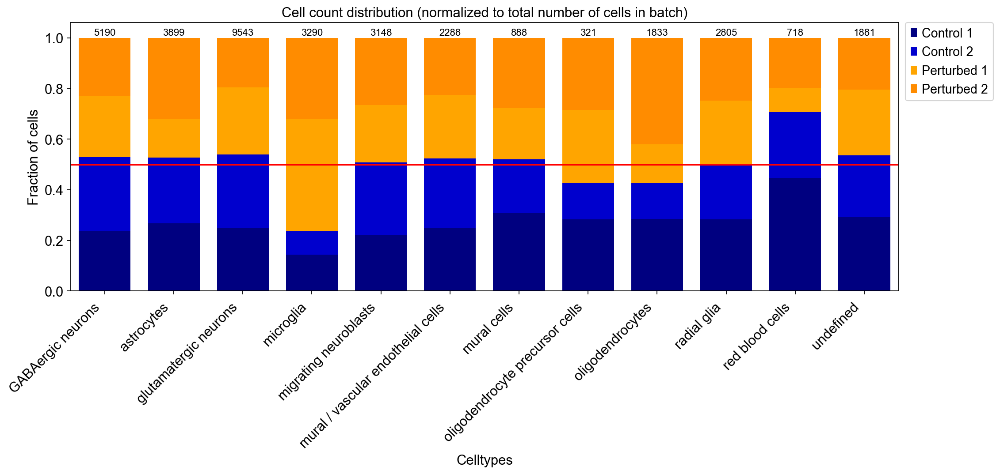

In [25]:
fig, ax = plt.subplots(figsize=(15, 5))
width = 0.75

clusters = df_normalized.index.values
cellcounts = df_normalized["total cellcount"].values

ax.bar(
    clusters,
    df_normalized["control1_fraction"].values,
    width,
    color="navy",
    label="Control 1",
)
ax.bar(
    clusters,
    df_normalized["control2_fraction"].values,
    width,
    bottom=df_normalized["control1_fraction"].values,
    color="mediumblue",
    label="Control 2",
)
ax.bar(
    clusters,
    df_normalized["experiment1_fraction"].values,
    width,
    bottom=df_normalized["control2_fraction"].values
    + df_normalized["control1_fraction"].values,
    color="orange",
    label="Perturbed 1",
)
ax.bar(
    clusters,
    df_normalized["experiment2_fraction"].values,
    width,
    bottom=df_normalized["experiment1_fraction"].values
    + df_normalized["control2_fraction"].values
    + df_normalized["control1_fraction"].values,
    color="darkorange",
    label="Perturbed 2",
)

# Add value above each bar
for index, value in enumerate(cellcounts):
    ax.text(x = index, y = 1.01, s = value, size = 10, ha='center')

ax.set_xticklabels(clusters, rotation=45, ha="right")

ax.legend(bbox_to_anchor=(1.001, 1.025), loc="upper left")

ax.set(
    **{
        "title": "Cell count distribution (normalized to total number of cells in batch)",
        "ylabel": "Fraction of cells",
        "xlabel": "Celltypes"
    }
)

ax.axhline(y=0.5, color="r", linestyle="-")

ax.margins(x=0.01, y=0.06)
ax.grid(False)

fig.show()

# Plot fold change of number of cells per celltype for experiment and control data (normalized to total cell count in each batch): 

/home/lauraluebbert/bin/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator


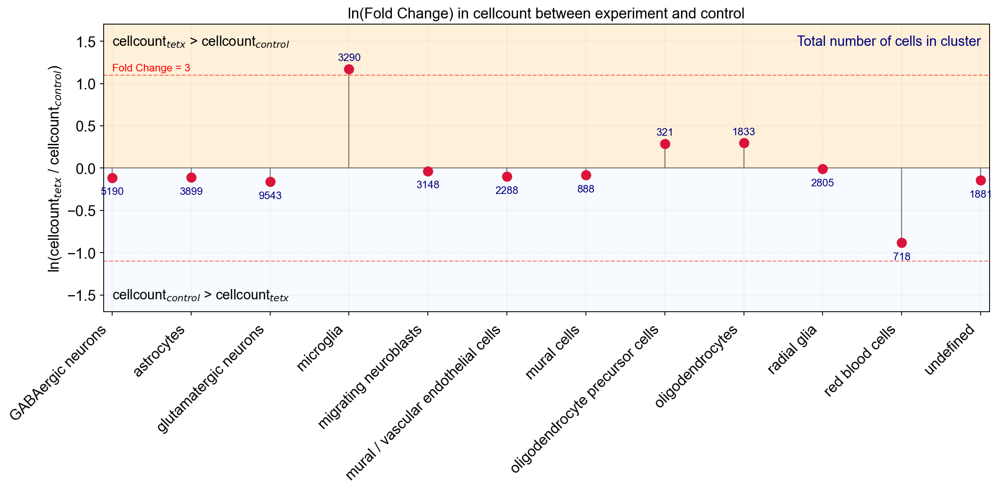

In [26]:
fig, ax = plt.subplots(figsize=(15, 5))

exp = df_normalized[["experiment1", "experiment2"]].sum(axis=1)
ctrl = df_normalized[["control1", "control2"]].sum(axis=1)

x = df_normalized.index.values
y = []
cell_counts = df_normalized["total cellcount"].values
cell_color = "navy"

counter = 0
del_idx = []

# Calculate log(fold change)
for i, exp_value in enumerate(exp):
    if cell_counts[i] < 100:
        # Collect indeces of labels to delete from x labels
        del_idx.append(i)
        continue
    else:
        y_temp = np.log(exp_value / ctrl[i])
        y.append(y_temp)
        if exp_value >= ctrl[i]:
            ax.text(x = counter, y = y_temp + 0.1, s = cell_counts[i], size = 10, ha='center', c=cell_color)
        if ctrl[i] >= exp_value:
            ax.text(x = counter, y = y_temp - 0.2, s = cell_counts[i], size = 10, ha='center', c=cell_color)
        counter +=1

x = np.delete(x, del_idx)

# Plot stem/scatter plot
ax.vlines(x, 0, y, color="black", linestyle="-", lw=1, zorder=-1)
ax.scatter(x , y, c="crimson", s=75)

ax.set(
    **{
        "title": "ln(Fold Change) in cellcount between experiment and control",
        "ylabel": "ln(cellcount$_{tetx}$ / cellcount$_{control}$)",
        "ylim": (-1.7, 1.7)
        #     "xlabel": "Celltypes"
    }
)

# ax.set_yscale('log')

# labels = ["", "3", "2", "1", "0", "1", "2", "3"]
# ax.set_yticklabels(labels)

ax.axhline(y=0, color="black", linestyle="-", lw=1, zorder=-1)
ax.set_xticklabels(x, rotation=45, ha="right")

ax.text(0, np.log(3)+0.05, "Fold Change = 3", ha="left", size=10, c='red')
ax.axhline(y=np.log(3), color="red", linestyle="--", lw=1, zorder=-1)
ax.axhline(y=-np.log(3), color="red", linestyle="--", lw=1, zorder=-1)

# Add blocks and text separating each comparison category
ax.axhspan(-1.7, 0, facecolor='aliceblue', alpha=0.5, zorder=-1)
ax.axhspan(0, 1.7, facecolor='moccasin', alpha=0.5, zorder=-1)
ax.text(0, -1.55, "cellcount$_{control}$ > cellcount$_{tetx}$", ha="left", size=13)
ax.text(0, 1.45, "cellcount$_{tetx}$ > cellcount$_{control}$", ha="left", size=13)
ax.text(11, 1.45, "Total number of cells in cluster", ha="right", c=cell_color, size=13)

ax.margins(x=0.01, y=0.01)
ax.grid(False)
ax.xaxis.grid(color='gray', ls='--', lw=0.1)
ax.yaxis.grid(color='gray', ls='--', lw=0.1)
ax.set_axisbelow(True)

plt.savefig("figures/4.2_cellcounts_sep_clustered.png", dpi=300, format="png", bbox_inches="tight")

fig.show()

___

# Compare DE genes found for each celltype between exp and ctrl

Heatmap showing expression of DE genes per celltype

In [27]:
df_DE_ctrl = pd.read_csv('CTRL_DE-genes.csv')
df_DE_exp = pd.read_csv('EXP_DE-genes.csv')
df_DE = pd.concat([df_DE_ctrl, df_DE_exp])
df_DE

,Unnamed: 0,cluster,DE gene,batch
0,0,1,ATP1B1_ENSTGUG00000013431.2,control
1,1,1,SST_ENSTGUG00000027783.1,control
2,2,1,SLC32A1_ENSTGUG00000004537.2,control
3,3,1,_ENSTGUG00000012363.2,control
4,4,1,DNER_ENSTGUG00000008311.2,control
...,...,...,...,...
110,110,15,TUBB2A_ENSTGUG00000028536.1,experiment
111,111,15,NSG2_ENSTGUG00000000333.2,experiment
112,112,15,RTN1_ENSTGUG00000013003.2,experiment
113,113,15,TUBA1B_ENSTGUG00000010166.2,experiment


### Per celltype instead of all clusters:

/home/lauraluebbert/bin/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1229: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'celltype_g' as categorical


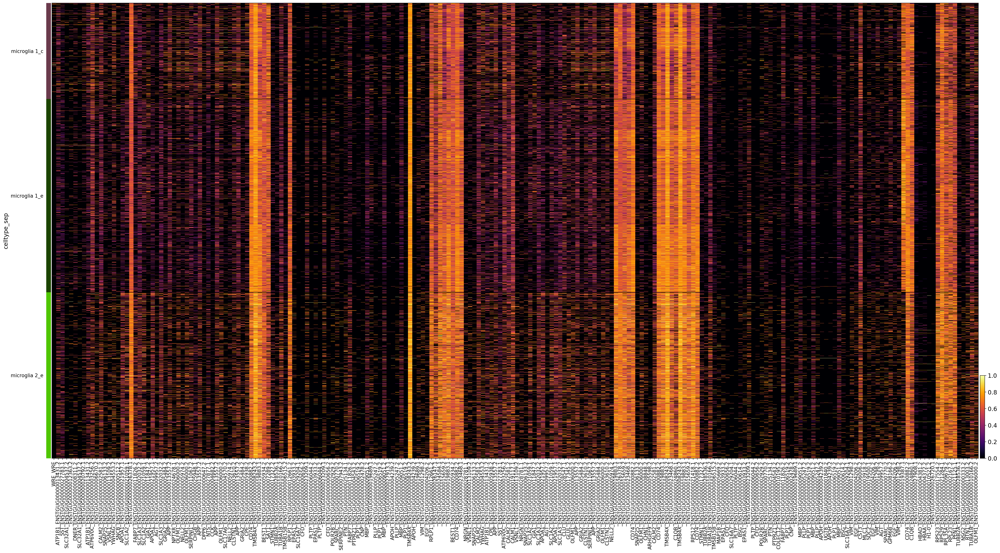

In [28]:
sc.pl.heatmap(
    adata[np.char.startswith(nd(adata.obs.celltype_sep.values).astype(str), "microglia")],
    # Also add WRE as the first gene
    np.concatenate((["WRE_WRE"], df_DE["DE gene"].values)),
    groupby="celltype_sep",
    show_gene_labels=True,
#     var_group_positions=var_groups,
#     var_group_labels=var_labels,
#     var_group_rotation=1,
    use_raw=False, # By default adata.raw.X is plotted. If use_raw=False is set, then adata.X is plotted. 
    cmap="inferno", # Alternative cmap: magma
    standard_scale="var", # standardize that dimension between 0 and 1, meaning for each variable or observation, subtract the minimum and divide each by its maximum
    swap_axes=False,
    figsize=(40,20),
    save=False
)

# !!! The second experiment microglia cluster (maybe these are the ones not present in control) does not express ENSTGUG00000019387 (novel gene) lik

Trying to set attribute `.obs` of view, copying.
... storing 'celltype_g' as categorical


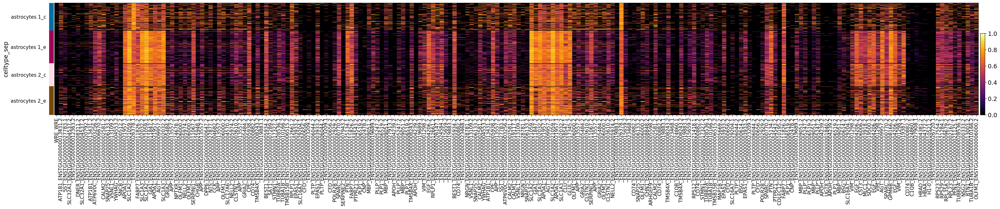

In [29]:
sc.pl.heatmap(
    adata[np.char.startswith(nd(adata.obs.celltype_sep.values).astype(str), "astrocytes")],
    # Also add WRE as the first gene
    np.concatenate((["WRE_WRE"], df_DE["DE gene"].values)),
    groupby="celltype_sep",
    show_gene_labels=True,
#     var_group_positions=var_groups,
#     var_group_labels=var_labels,
#     var_group_rotation=1,
    use_raw=False, # By default adata.raw.X is plotted. If use_raw=False is set, then adata.X is plotted. 
    cmap="inferno", # Alternative cmap: magma
    standard_scale="var", # standardize that dimension between 0 and 1, meaning for each variable or observation, subtract the minimum and divide each by its maximum
    swap_axes=False,
    figsize=(40,5),
    save=False
)

Trying to set attribute `.obs` of view, copying.
... storing 'celltype_g' as categorical


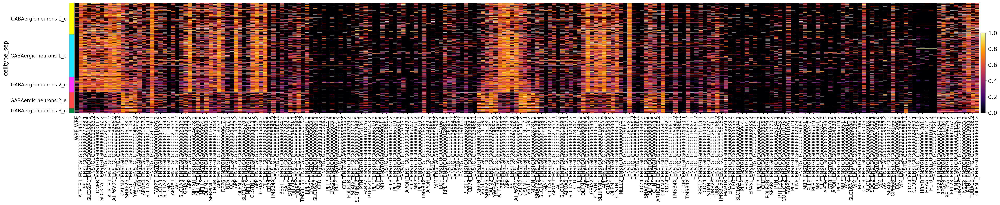

In [30]:
sc.pl.heatmap(
    adata[np.char.startswith(nd(adata.obs.celltype_sep.values).astype(str), "GABA")],
    # Also add WRE as the first gene
    np.concatenate((["WRE_WRE"], df_DE["DE gene"].values)),
    groupby="celltype_sep",
    show_gene_labels=True,
#     var_group_positions=var_groups,
#     var_group_labels=var_labels,
#     var_group_rotation=1,
    use_raw=False, # By default adata.raw.X is plotted. If use_raw=False is set, then adata.X is plotted. 
    cmap="inferno", # Alternative cmap: magma
    standard_scale="var", # standardize that dimension between 0 and 1, meaning for each variable or observation, subtract the minimum and divide each by its maximum
    swap_axes=False,
    figsize=(40,5),
    save=False
)

Trying to set attribute `.obs` of view, copying.
... storing 'celltype_g' as categorical


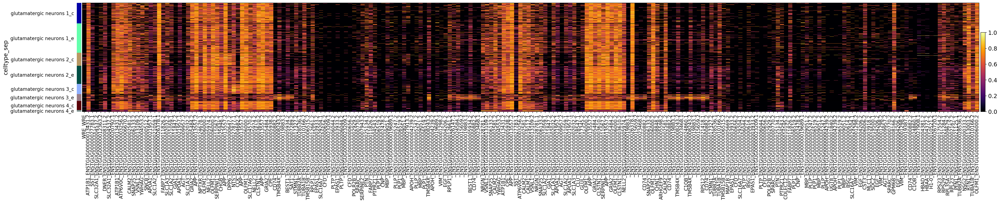

In [31]:
sc.pl.heatmap(
    adata[np.char.startswith(nd(adata.obs.celltype_sep.values).astype(str), "glut")],
    # Also add WRE as the first gene
    np.concatenate((["WRE_WRE"], df_DE["DE gene"].values)),
    groupby="celltype_sep",
    show_gene_labels=True,
#     var_group_positions=var_groups,
#     var_group_labels=var_labels,
#     var_group_rotation=1,
    use_raw=False, # By default adata.raw.X is plotted. If use_raw=False is set, then adata.X is plotted. 
    cmap="inferno", # Alternative cmap: magma
    standard_scale="var", # standardize that dimension between 0 and 1, meaning for each variable or observation, subtract the minimum and divide each by its maximum
    swap_axes=False,
    figsize=(40,5),
    save=False
)

# Is there a different GABA cluster in EXP? (WRE +?)

___

# Compare expression of cell state DE genes found in jointly clustered data in microglia clusters

In [32]:
nadia_markers = ["_ENSTGUG00000019883.1",
                 "CD74_ENSTGUG00000000882.2",
                 "RPS12_ENSTGUG00000021418.1",
                 "TMSB4X_ENSTGUG00000008243.2",
                 "_ENSTGUG00000015659.2",
                 "PFN1_ENSTGUG00000021125.1",
                 "RPS20_ENSTGUG00000011097.2",
                 "RPS29_ENSTGUG00000021284.1",
                 "_ENSTGUG00000024584.1"
                ]

Trying to set attribute `.obs` of view, copying.
... storing 'celltype_g' as categorical


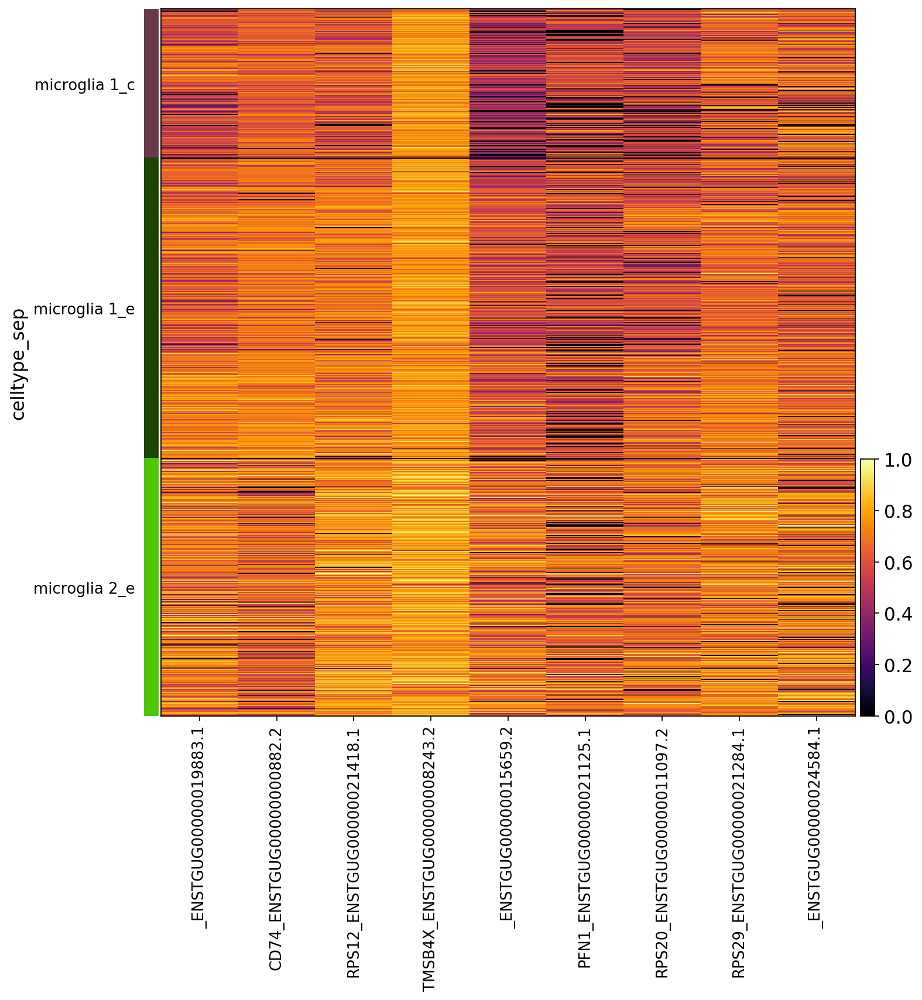

In [33]:
sc.pl.heatmap(
    adata[np.char.startswith(nd(adata.obs.celltype_sep.values).astype(str), "microglia")],
    nadia_markers,
    groupby="celltype_sep",
    show_gene_labels=True,
#     var_group_positions=var_groups,
#     var_group_labels=var_labels,
#     var_group_rotation=1,
    use_raw=False, # By default adata.raw.X is plotted. If use_raw=False is set, then adata.X is plotted. 
    cmap="inferno", # Alternative cmap: magma
    standard_scale="var", # standardize that dimension between 0 and 1, meaning for each variable or observation, subtract the minimum and divide each by its maximum
    swap_axes=False,
    figsize=(10, 10),
    save=False
)

___

# Violin plots

Split experiment and control data into separate AnnData objects for plotting:

In [34]:
adata_exp = adata[adata.obs.batch_g=="experiment"]
adata_ctrl = adata[adata.obs.batch_g=="control"]

# Expression of synaptogenesis genes 
DE from CTRL undefined glut neurons

In [35]:
syanpto = [
    "NPTXR_ENSTGUG00000024678.1",
    "NPTX1_ENSTGUG00000025297.1", 
    "NPTX2_ENSTGUG00000008623.2",  
    "NRXN1_ENSTGUG00000005731.2",
    "CNTN4_ENSTGUG00000010102.2",
    "CACNA2D1_ENSTGUG00000002536.2",
]

Bluk celltype analysis; including all clusters for each celltype (obs column: celltype_g).


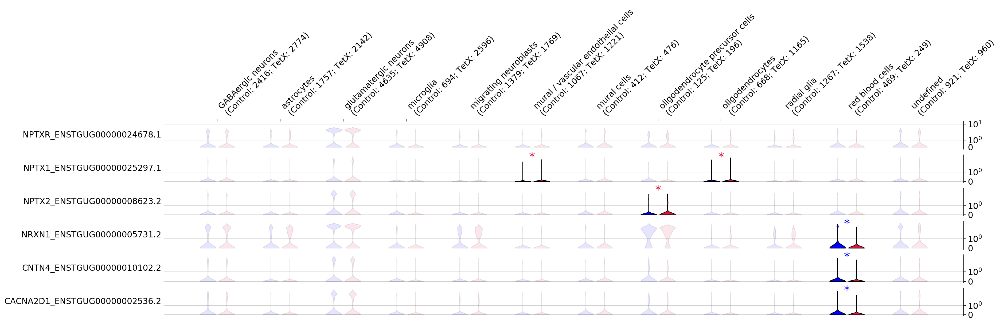

In [36]:
genes = syanpto
labels = syanpto
celltypes = np.unique(adata.obs.celltype_g.values)

violinplot(
    adata_exp,
    adata_ctrl,
    genes,
    labels,
    celltypes,
    fig_name="Sep_synapto",
    fold_change_min=2,
)

# Expression of MHC1 related genes across all celltypes

# Genes related to MHC Class 1
Regulation of CNS synapses by neuronal MHC class I https://pubmed.ncbi.nlm.nih.gov/17420446/

In [72]:
mhc_genes = ["_ENSTGUG00000017273.2", "_ENSTGUG00000004607.2", "CD3E_ENSTGUG00000022317.1", "_ENSTGUG00000010325.2"]
mhc_gene_names = ["MHC1", "B2M", "CD3E", "CCL3L3"]

Abbreviations:  
MHC1 = Major Histocompatibility Complex, Class I (alpha chain-like)
B2M = Beta-2-Microglobulin

/home/lauraluebbert/projects/finchseq/Torok-data-analysis/plotting_funcs.py:66: RuntimeWarning: divide by zero encountered in float_scalars
  fold_change = np.mean(cell_array) / np.mean(x_ctrl[index])


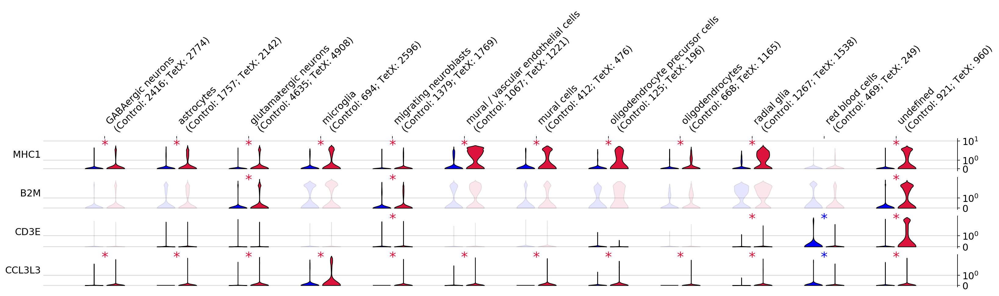

In [73]:
genes = mhc_genes
labels = mhc_gene_names
celltypes = np.unique(adata.obs.celltype_g.values)

violinplot(
    adata_exp,
    adata_ctrl,
    genes,
    labels,
    celltypes,
    fig_name="Sep_MHC_short",
    fold_change_min=2,
)

In [74]:
# MHCI associated genes
mhc_genes = [
    "_ENSTGUG00000017273.2",
    "_ENSTGUG00000028417.1",
    "_ENSTGUG00000004607.2",
    "_ENSTGUG00000010325.2",
    "CX3CR1_ENSTGUG00000018365.2",
    "_ENSTGUG00000024320.1",
#     "_ENSTGUG00000010847.2",
    "CD3E_ENSTGUG00000022317.1",
    "IFI30_ENSTGUG00000000388.2",
    "FGL2_ENSTGUG00000002746.2",
    "TAF7_ENSTGUG00000006593.2",
    "CALR_ENSTGUG00000014982.2",
    "_ENSTGUG00000015337.2",
    "CTSH_ENSTGUG00000009976.2",
    "PDIA3_ENSTGUG00000010220.2",
#     "CD8A_ENSTGUG00000010841.2",
    "IDE_ENSTGUG00000008951.2",
    "ATP5F1A_ENSTGUG00000001582.2",
    "ATP5F1B_ENSTGUG00000015620.2",
]
mhc_gene_names = [
    "MHC1 F10 alpha chain-like 1",
    "MHC1 F10 alpha chain like 2",
    "Beta-2-microglobulin",
    "CCL3L3",
    "CX3CR1",
    "CX3CL1",
#     "MHC1 protein binding like",
    "CD3E",
    "IFI30",
    "Fibrinogen like 2",
    "TAF7",
    "Calreticulin",
    "Antigen peptide transporter like",
    "Cathepsin H",
    "PDIA3",
#     "CD8A",
    "IDE",
    "ATP5F1A",
    "ATP5F1B",
]

/home/lauraluebbert/projects/finchseq/Torok-data-analysis/plotting_funcs.py:74: RuntimeWarning: invalid value encountered in float_scalars
  fold_change = np.mean(x_ctrl[index]) / np.mean(cell_array)
/home/lauraluebbert/projects/finchseq/Torok-data-analysis/plotting_funcs.py:74: RuntimeWarning: divide by zero encountered in float_scalars
  fold_change = np.mean(x_ctrl[index]) / np.mean(cell_array)


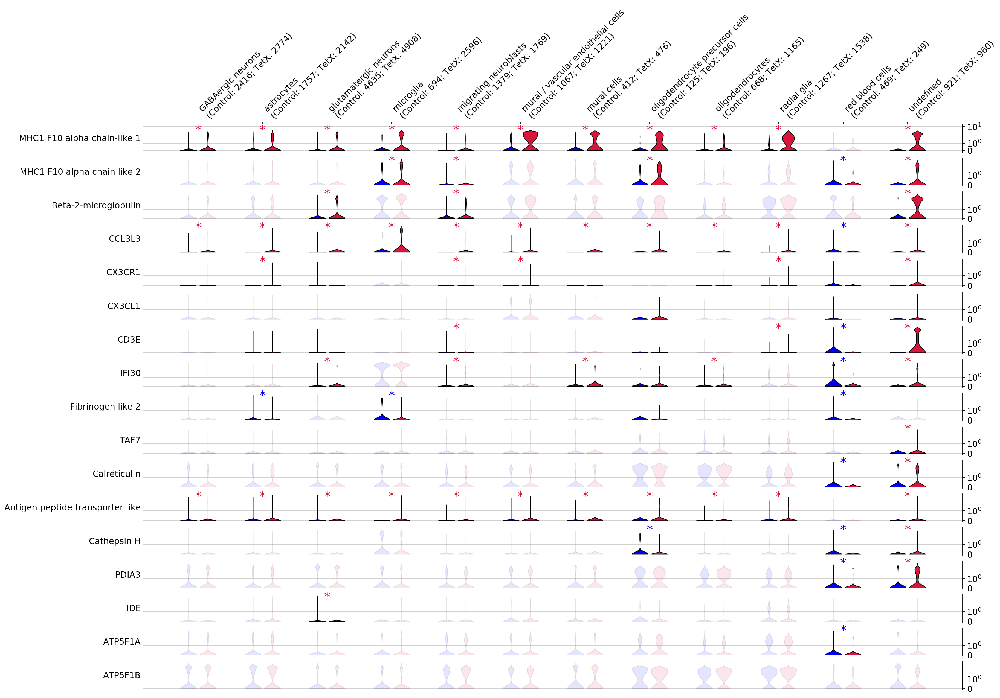

In [75]:
genes = mhc_genes
labels = mhc_gene_names
celltypes = np.unique(adata.obs.celltype_g.values)

violinplot(
    adata_exp,
    adata_ctrl,
    genes,
    labels,
    celltypes,
    fig_name="Sep_MHC1-associated",
)

# NMPA and AMPA receptor associated genes

In [76]:
nmda = [
    ## AMPA
    # cornichon family AMPA receptor auxiliary proteins
    "CNIH1_ENSTGUG00000013093.2",
    "CNIH3_ENSTGUG00000004070.2",
    "CNIH4_ENSTGUG00000025113.1",
    # Glutamate ionotropic receptor AMPA type subunits
    "GRIA1_ENSTGUG00000000726.2",
    "GRIA2_ENSTGUG00000005484.2",
    "GRIA3_ENSTGUG00000003563.2",
    "GRIA4_ENSTGUG00000012676.2",
    # Part of AMPA glutamate receptor complex
    "OLFM3_ENSTGUG00000029430.1",
    "SHISA9_ENSTGUG00000005074.2",
    "VWC2_ENSTGUG00000007906.2",
    "VWC2L_ENSTGUG00000002893.2",
    "CACNG1_ENSTGUG00000004397.2",
    "CACNG2_ENSTGUG00000010725.2",
    "CACNG3_ENSTGUG00000006208.2",
    "CACNG4_ENSTGUG00000004385.2",
    "CACNG5_ENSTGUG00000026853.1",
    "ABHD6_ENSTGUG00000007463.2",
    "ABHD12_ENSTGUG00000004985.2",
    # AMPA receptor activity modulators
    "ADRB1_ENSTGUG00000010890.2",   # Adrenoceptors
    "ADRB2_ENSTGUG00000000286.2",
    #
    ## Possibly involved in receptor clustering on the cell membrane
    "SLC6A6_ENSTGUG00000008337.2",  # From DE genes
    "SLC7A11_ENSTGUG00000001504.2",
    "DLG3_ENSTGUG00000007374.2",
    ## General receptor activity regulators
    "NLGN1_ENSTGUG00000021670.1",
    "RELN_ENSTGUG00000002836.2",
    #
    ## NMDA
    # NMDA receptor synaptonuclear signaling and neuronal migration factor
    "NSMF_ENSTGUG00000002736.2",
    # Receptor subunits
    "GRIN1_ENSTGUG00000002568.2",
    "GRINA_ENSTGUG00000021030.1",
    "GRIN2A_ENSTGUG00000004747.2",
    "GRIN2B_ENSTGUG00000009456.2",
    "GRIN2C_ENSTGUG00000008858.2",
    "GRIN2D_ENSTGUG00000021251.1",
    "GRIN3A_ENSTGUG00000000661.2",
    "GRIN3B_ENSTGUG00000000668.2",
    # Part of NMDA selective glutamate receptor complex
    "EPS8_ENSTGUG00000012399.2",
    # NMDA receptor activity modulators
    "DAPK1_ENSTGUG00000000606.2",
    "RASGRF2_ENSTGUG00000007037.2",
    "DRD1_ENSTGUG00000000340.2",
    "CRH_ENSTGUG00000011277.2",
]

In [ ]:
genes = nmda
labels = nmda
celltypes = np.unique(adata.obs.celltype_g.values)

violinplot(
    adata_exp,
    adata_ctrl,
    genes,
    labels,
    celltypes,
    fig_name="Sep_AMPA_NMDA",
)